<a href="https://colab.research.google.com/github/ArifAygun/Iron-Ore-Froth-Flotation-Quality-Prediction/blob/main/AA_Graduate_Project_2_Iron.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Quality Prediction of Iron Ore Mining Flotation Process - Part:2 (Iron Concentrate)**

In [36]:
import math
import random
import pandas as pd
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import scipy.stats as stats
from scipy.stats import norm
import statsmodels.api as sm
import matplotlib.pyplot as plt
from scipy.stats import skew, norm
sns.set_theme(color_codes=True)
%matplotlib inline

import xgboost as xgb
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from lightgbm import LGBMRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.linear_model import LinearRegression, ElasticNet, BayesianRidge
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, AdaBoostRegressor
from sklearn.model_selection import KFold, cross_val_predict, GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import RepeatedKFold, cross_val_score, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error, mean_squared_log_error, mean_absolute_error, r2_score

In [37]:
from google.colab import drive
drive.mount('/content/drive/')
%cd /content/drive/My Drive/Flotation/

flotation = pd.read_csv('flotation_grouped.csv')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
/content/drive/My Drive/Flotation


In [38]:
# Use a function to reduce memory usage of the dataframe by modifying the datatypes
def reduce_mem_usage(flotation, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = flotation.memory_usage().sum() / 1024**2    
    for col in flotation.columns:
        col_type = flotation[col].dtypes
        if col_type in numerics:
            c_min = flotation[col].min()
            c_max = flotation[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    flotation[col] = flotation[col].astype(np.int8)
                elif c_min > flotation.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                       flotation[col] = flotation[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    flotation[col] = flotation[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    flotation[col] = flotation[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    flotation[col] = flotation[col].astype(np.float32)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    flotation[col] = flotation[col].astype(np.float32)
                else:
                    flotation[col] = flotation[col].astype(np.float64)    
    end_mem = flotation.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return flotation

flotation = reduce_mem_usage(flotation)

Mem. usage decreased to  0.17 Mb (50.0% reduction)


##**5. Exploratory Data Analysis**

###**5.1. Corellation Between the Variables**

In [39]:
round(flotation.describe(),3).T

,count,mean,std,min,25%,50%,75%,max
iron_feed,4097.0,56.295,5.158,42.740,52.670,56.080,59.720,65.780
silica_feed,4097.0,14.652,6.808,1.310,8.940,13.850,19.600,33.400
starch_flow,4097.0,338.146,92.677,102.567,283.587,335.505,382.469,963.312
amina_flow,4097.0,488.161,83.694,242.927,436.038,502.454,549.522,736.982
pulp_flow,4097.0,397.576,8.370,376.838,398.849,399.841,400.582,418.070
pulp_pH,4097.0,9.768,0.378,8.750,9.541,9.796,10.031,10.810
pulp_density,4097.0,1.680,0.064,1.520,1.651,1.696,1.722,1.833
airflow,4097.0,288.657,18.520,221.602,278.442,299.805,299.976,316.005
level,4097.0,467.252,74.329,340.585,399.869,456.895,514.547,745.230
iron_conc,4097.0,65.050,1.118,62.050,64.370,65.210,65.860,68.010


- Iron Feed: The iron feed values range from 42.74 to 65.78 with a mean of 56.295. The standard deviation indicates moderate variability in the data.

- Silica Feed: The silica feed values range from 1.31 to 33.4 with a mean of 14.652. The data shows a wider range and higher variability compared to the iron feed.

- Starch Flow: The starch flow values range from 102.567 to 963.312 with a mean of 338.146. There is a considerable range in values, indicating significant variability in starch flow.

- Amina Flow: The amina flow values range from 242.927 to 736.982 with a mean of 488.161. The data shows moderate variability.

- Pulp Flow: The pulp flow values range from 376.838 to 418.07 with a mean of 397.576. The data indicates relatively low variability.

- Pulp pH: The pulp pH values range from 8.75 to 10.81 with a mean of 9.768. The data shows moderate variability.

- Pulp Density: The pulp density values range from 1.52 to 1.833 with a mean of 1.68. The data indicates moderate variability.

- Airflow: The airflow values range from 221.602 to 316.005 with a mean of 288.657. The data shows moderate variability.

- Level: The level values range from 340.585 to 745.23 with a mean of 467.252. The data indicates moderate variability.

- Iron Concentrate: The iron concentrate values range from 62.05 to 68.01 with a mean of 65.05. The data shows relatively low variability.

- Silica Concentrate: The silica concentrate values range from 0.6 to 5.53 with a mean of 2.327. The data shows higher variability compared to the iron concentrate.

In [40]:
flotation.corr()

,iron_feed,silica_feed,starch_flow,amina_flow,pulp_flow,pulp_pH,pulp_density,airflow,level,iron_conc,silica_conc
iron_feed,1.000000,-0.971833,-0.012753,-0.096215,0.186379,0.007458,-0.136404,-0.080216,0.028466,0.055454,-0.077114
silica_feed,-0.971833,1.000000,0.029140,0.085890,-0.174834,0.008383,0.113417,0.107268,-0.049391,-0.044189,0.072782
starch_flow,-0.012753,0.029140,1.000000,0.039488,0.047801,0.230099,-0.118724,0.143422,-0.097972,0.035205,-0.043536
amina_flow,-0.096215,0.085890,0.039488,1.000000,0.237586,0.134163,0.659765,0.131672,-0.324536,-0.120416,0.171142
pulp_flow,0.186379,-0.174834,0.047801,0.237586,1.000000,0.138802,0.019916,-0.181273,-0.030256,0.096595,0.009619
pulp_pH,0.007458,0.008383,0.230099,0.134163,0.138802,1.000000,0.122639,0.182103,-0.121504,0.197962,-0.151422
pulp_density,-0.136404,0.113417,-0.118724,0.659765,0.019916,0.122639,1.000000,-0.023721,-0.148443,0.016802,0.050825
airflow,-0.080216,0.107268,0.143422,0.131672,-0.181273,0.182103,-0.023721,1.000000,-0.461957,0.050338,-0.165113
level,0.028466,-0.049391,-0.097972,-0.324536,-0.030256,-0.121504,-0.148443,-0.461957,1.000000,0.072211,-0.078572
iron_conc,0.055454,-0.044189,0.035205,-0.120416,0.096595,0.197962,0.016802,0.050338,0.072211,1.000000,-0.801212


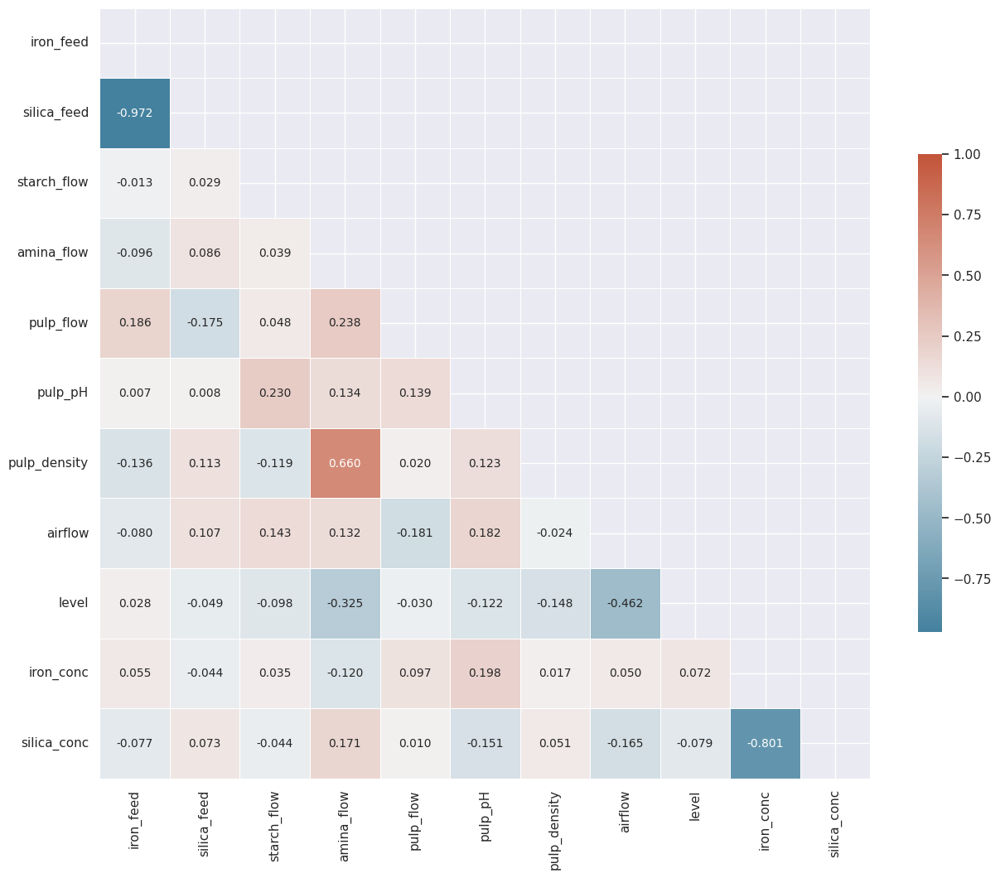

In [41]:
# Correlation Heatmap
f, ax = plt.subplots(figsize=(15, 15))
mat = flotation.corr('pearson')
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, 
            center=0, annot = True, square=True, 
            linewidths=.5, annot_kws={"fontsize": 10}, 
            cbar_kws={"shrink": .5}, fmt='.3f')
plt.show()

**Correlation between the target variables (silica concentrate and iron concentrate) and features:**

**Silica Concentrate** has a weak positive correlation with pulp pH (0.072782), suggesting that higher pulp pH values may be associated with higher silica concentrate levels.
It has a weak negative correlation with airflow (-0.077114), indicating that higher airflow may be associated with lower silica concentrate levels.
Other variables such as iron feed, starch flow, amina flow, pulp flow, pulp density, level, and iron concentrate have correlations with silica concentrate close to zero, indicating a lack of significant linear relationship.

**Iron Concentrate** has a strong negative correlation with silica concentrate (-0.801212), indicating an inverse relationship between the two target variables. This implies that as the iron concentrate increases, the silica concentrate tends to decrease, and vice versa.
It has a weak positive correlation with pulp pH (0.197962), suggesting that higher pulp pH values may be associated with higher iron concentrate levels.
Iron Concentrate has weak correlations close to zero with the other features, including iron feed, silica feed, starch flow, amina flow, pulp flow, pulp density, airflow, and level.
Overall, the correlation analysis suggests that the target variables, silica concentrate and iron concentrate, have relatively weak correlations with the other nine features. The most notable correlation is the strong negative correlation between silica concentrate and iron concentrate, indicating an inverse relationship between them. 

**Pairplot**

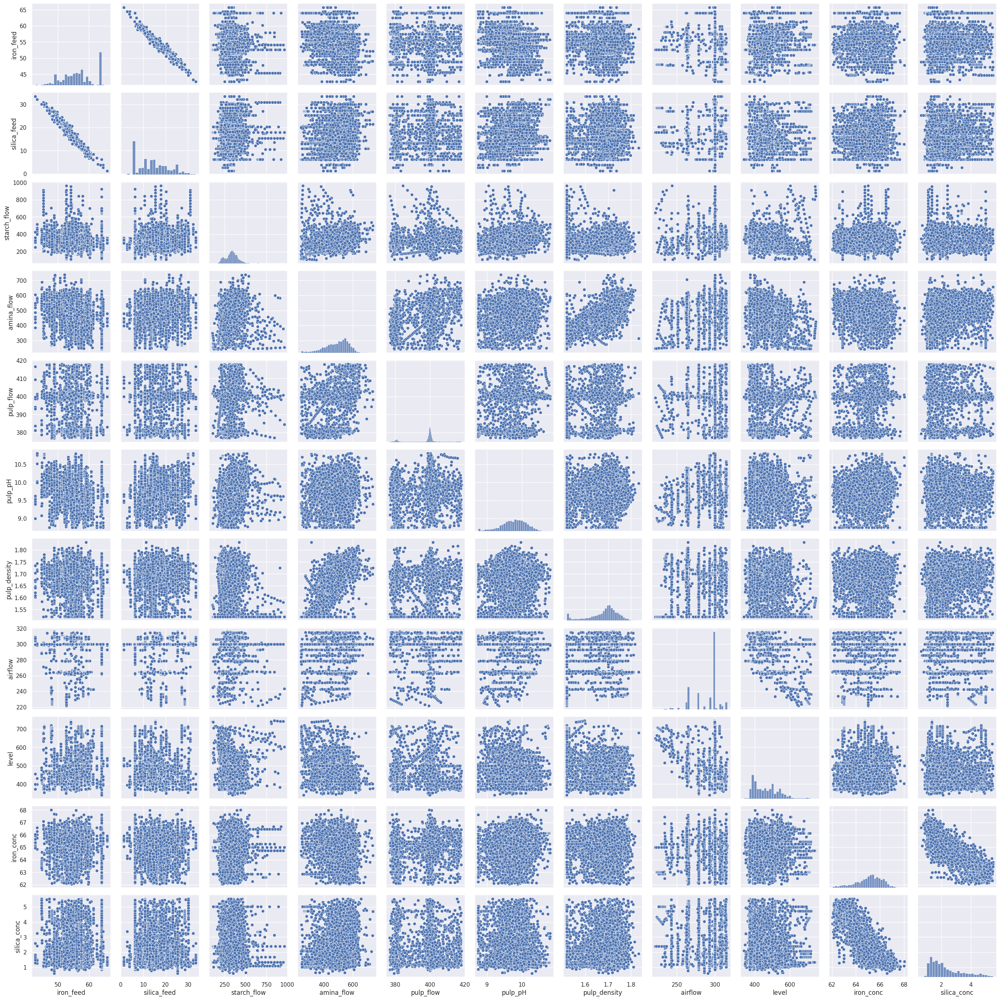

In [42]:
sns.pairplot(flotation[['iron_feed', 'silica_feed', 'starch_flow', 'amina_flow', 
                        'pulp_flow', 'pulp_pH', 'pulp_density', 'airflow', 
                        'level', 'iron_conc', 'silica_conc']]);

**Relationships between target variables (Iron Concentrate - Silica Concentrate) and Independent variables**

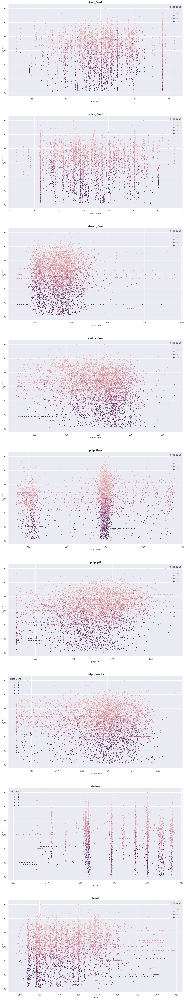

In [43]:
# Select the columns for the scatter plots
columns = ['iron_feed', 'silica_feed', 'starch_flow', 'amina_flow', 
           'pulp_flow', 'pulp_pH', 'pulp_density', 'airflow', 'level']

num_plots = min(len(columns), 9)

fig, axs = plt.subplots(9, 1, figsize=(15, 80))

axs = axs.flatten()

for i in range(num_plots):
    col = columns[i]
    sns.scatterplot(data=flotation, x=col, y='iron_conc', hue='silica_conc', ax=axs[i])
    axs[i].set_title(col, fontsize=14, fontweight='bold')

for j in range(num_plots, 9):
    fig.delaxes(axs[j])

plt.tight_layout(h_pad=5)
plt.show()

### **5.2. Target Variable (Iron) Statistics**

**Histogram of Iron Concentrate**

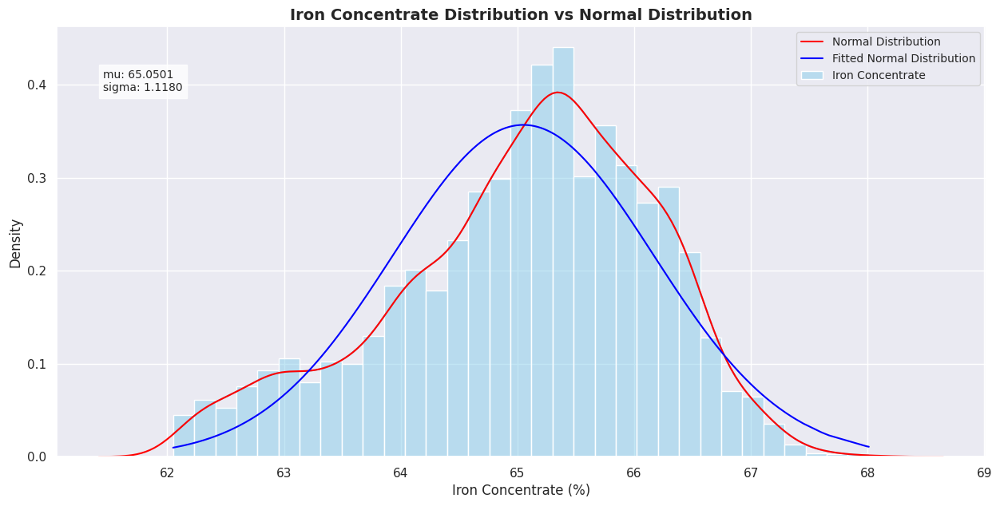

In [44]:
# Fitting normal distribution
(mu, sigma) = norm.fit(flotation['iron_conc'])

# Plotting the histogram, KDE, and fitted normal distribution
plt.figure(figsize=(15, 7))
sns.histplot(flotation['iron_conc'], kde=True, stat="density", common_norm=False,
color='skyblue', label='Iron Concentrate')
sns.kdeplot(flotation['iron_conc'], color='red', label='Normal Distribution')
sns.lineplot(x=flotation['iron_conc'], y=norm.pdf(flotation['iron_conc'], mu, sigma),
color='blue', label='Fitted Normal Distribution')

plt.text(0.05, 0.85, f"mu: {mu:.4f}\nsigma: {sigma:.4f}", 
         transform=plt.gca().transAxes,
         bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

plt.title('Iron Concentrate Distribution vs Normal Distribution', fontsize=14, fontweight='bold')
plt.xlabel("Iron Concentrate (%)", fontsize=12)
plt.ylabel("Density", fontsize=12)
plt.legend(fontsize=10)
plt.show()

- mu = 65.0501 indicates that, on average, the Silica Concentrate percentage is around 65.05%. 
- sigma = The standard deviation of 1.1180 suggests that the data points are dispersed around the mean, with a typical deviation of approximately 1.11%.

- The histogram and KDE plot show the distribution of the actual data, while the red curve represents the fitted normal distribution.
- The blue line represents the line plot of the fitted normal distribution, providing a visual representation of how well the normal distribution fits the data.

**Skewness and Kurtosis**

In [45]:
t,p = stats.shapiro(flotation['iron_conc'])

print("Skewness: %f" % abs(flotation['iron_conc']).skew())
print("Kurtosis: %f" % abs(flotation['iron_conc']).kurt())
print("Shapiro_Test of t: %f" % t)
print("Shapiro_Test of p: %f" % p)

Skewness: -0.519468
Kurtosis: -0.195549
Shapiro_Test of t: 0.974150
Shapiro_Test of p: 0.000000


- The skewness is negative, it indicates that the distribution is slightly left-skewed, meaning that the tail of the distribution extends more towards lower values.

- The kurtosis is less than 0, it suggests that the distribution has lighter tails than a normal distribution, indicating it is slightly platykurtic.

- The Shapiro-Wilk test assesses the null hypothesis that the 'iron_conc' variable is normally distributed. In this case, the test statistic ('t') is 0.974150, and the p-value ('p') is 0.000000. Since the p-value is less than the significance level of 0.05, we can reject the null hypothesis. This suggests that the 'iron_conc' variable is not normally distributed.

- Overall, based on the skewness, kurtosis, and Shapiro-Wilk test results, the 'iron_conc' variable in the flotation dataset deviates slightly from a normal distribution. This implies that when working with this variable, it may be necessary to consider alternative statistical techniques or apply transformations to address the non-normality.

**Fitting the distribution of Silica Concentrate**

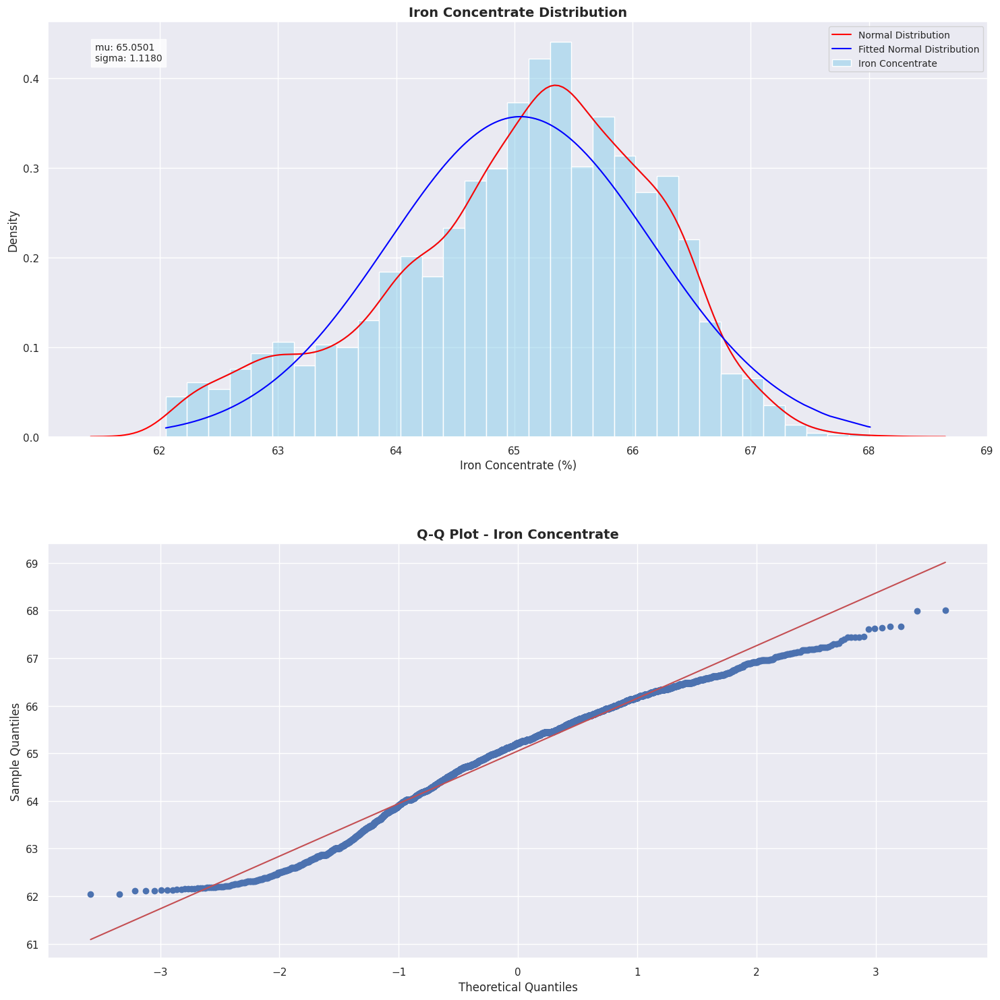

In [46]:
# Fitting normal distribution
(mu, sigma) = norm.fit(flotation['iron_conc'])

fig, axes = plt.subplots(2, 1, figsize=(15, 15))

# Histogram, KDE, and fitted normal distribution
sns.histplot(flotation['iron_conc'], kde=True, stat="density", common_norm=False, 
             color='skyblue', label='Iron Concentrate', ax=axes[0])
sns.kdeplot(flotation['iron_conc'], color='red', label='Normal Distribution', ax=axes[0])
sns.lineplot(x=flotation['iron_conc'], y=norm.pdf(flotation['iron_conc'], mu, sigma), 
             color='blue', label='Fitted Normal Distribution', ax=axes[0])

axes[0].text(0.05, 0.95, f"mu: {mu:.4f}\nsigma: {sigma:.4f}", transform=axes[0].transAxes,
             verticalalignment='top',bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

axes[0].set_title('Iron Concentrate Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel("Iron Concentrate (%)", fontsize=12)
axes[0].set_ylabel("Density", fontsize=12)
axes[0].legend(loc='upper right', fontsize=10)

# Q-Q plot
stats.probplot(flotation['iron_conc'], dist='norm', plot=axes[1])
axes[1].set_title("Q-Q Plot - Iron Concentrate", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Theoretical Quantiles", fontsize=12)
axes[1].set_ylabel("Sample Quantiles", fontsize=12)

plt.tight_layout(h_pad=5)
plt.show()

Now let's try to tranform our silica concentration distribution into a normal one. To do this we use a log transformation. We will use qq-plot to see the transformation effect.

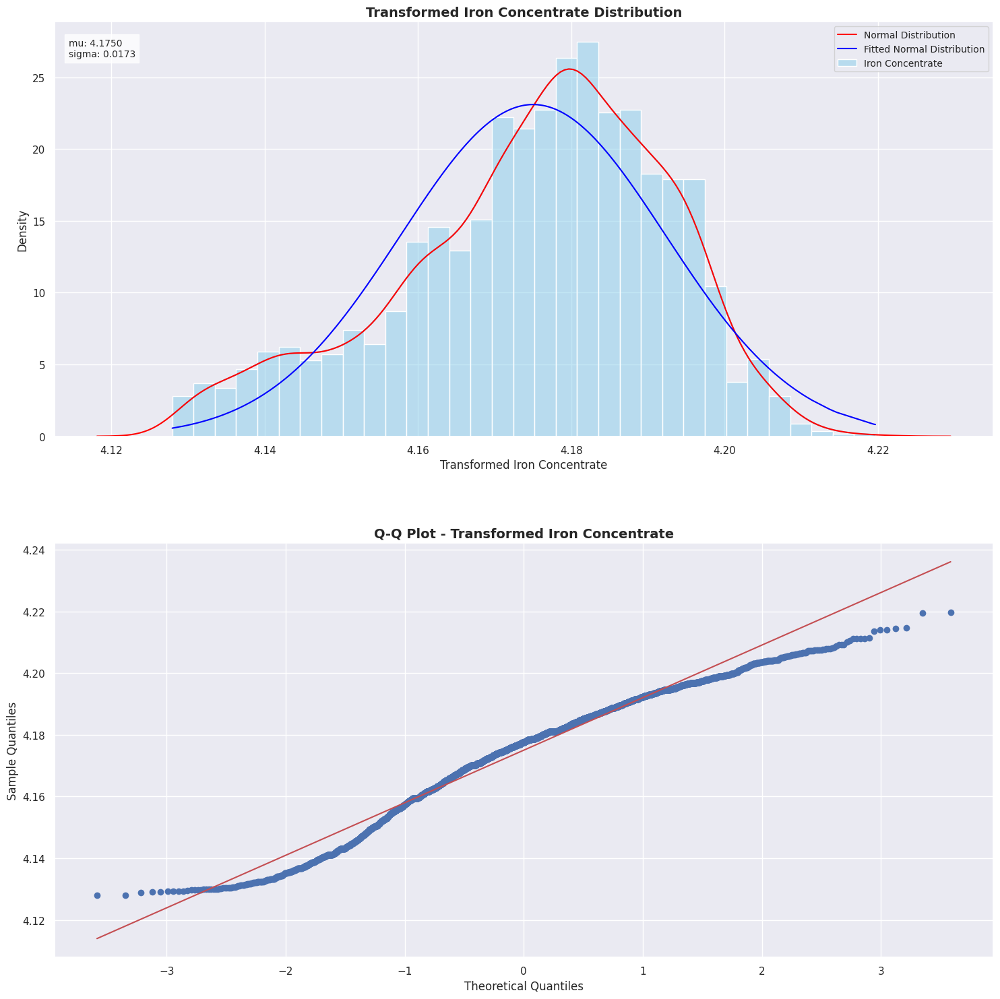

In [47]:
# Log transformation
transformed_conc = np.log(flotation['iron_conc'])

# Fitting normal distribution
(mu, sigma) = norm.fit(transformed_conc)

# Creating subplots
fig, axes = plt.subplots(2, 1, figsize=(15, 15))

sns.histplot(transformed_conc, kde=True, stat="density", common_norm=False, 
             color='skyblue', label='Iron Concentrate', ax=axes[0])
sns.kdeplot(transformed_conc, color='red', label='Normal Distribution', ax=axes[0])
sns.lineplot(x=transformed_conc, y=norm.pdf(transformed_conc, mu, sigma), 
             color='blue', label='Fitted Normal Distribution', ax=axes[0])

axes[0].set_title('Transformed Iron Concentrate Distribution', fontsize=14, fontweight='bold')
axes[0].set_xlabel("Transformed Iron Concentrate", fontsize=12)
axes[0].set_ylabel("Density", fontsize=12)
axes[0].legend(loc='upper right', fontsize=10)

axes[0].text(0.015, 0.96, f"mu: {mu:.4f}\nsigma: {sigma:.4f}", transform=axes[0].transAxes,
             verticalalignment='top',bbox=dict(facecolor='white', alpha=0.8), fontsize=10)

# Q-Q plot for transformed data
stats.probplot(transformed_conc, dist='norm', plot=axes[1])
axes[1].set_title("Q-Q Plot - Transformed Iron Concentrate", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Theoretical Quantiles", fontsize=12)
axes[1].set_ylabel("Sample Quantiles", fontsize=12)

plt.tight_layout(h_pad=5)
plt.show()

- **Histogram** shows the distribution of the transformed iron concentrate variable, with the density curve overlaid. The red curve represents a normal distribution fit to the data. The blue line represents the fitted normal distribution curve, which is based on the calculated mean (mu) of 4.1750 and standard deviation (sigma) of 0.0173.

- **Q-Q plot** compares the sample quantiles of the transformed iron concentrate data to the theoretical quantiles of a normal distribution. If the data points fall approximately along the diagonal line, it suggests that the data follows a normal distribution. In this case, the transformed iron concentrate data points align quite well with the diagonal line, indicating that the log-transformed variable approximates a normal distribution.

- According to the histogram, KDE plot, fitted normal distribution curve, and Q-Q plot, the log-transformed iron concentrate variable appears to exhibit a relatively normal distribution. 


**Iron vs Silica Concentrate Concentrate**

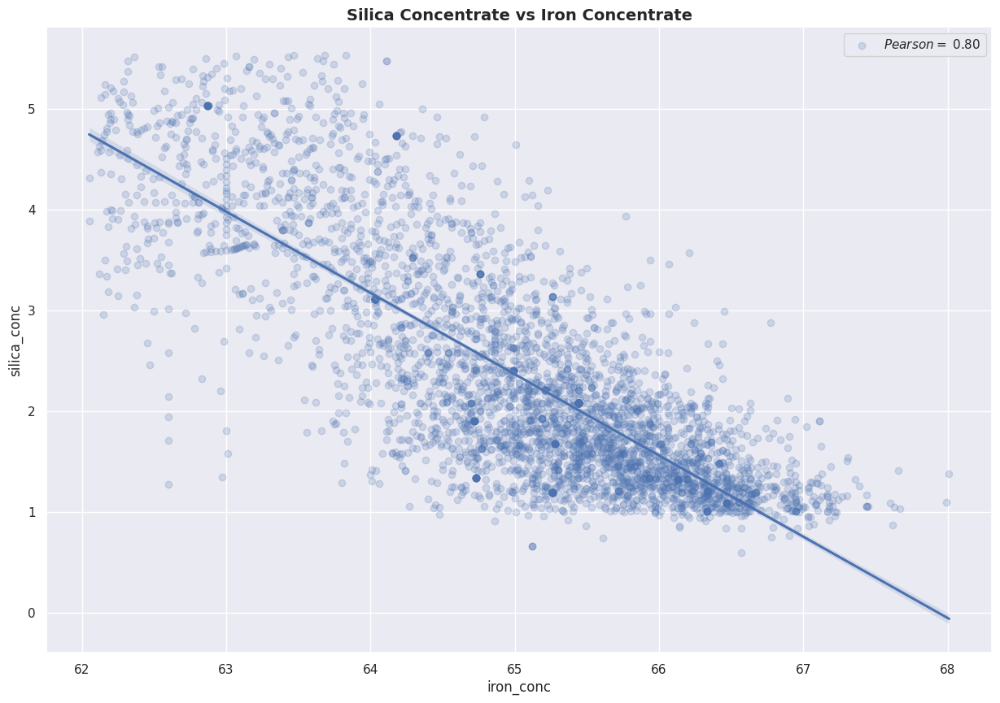

In [48]:
# silica concentrate (target_1) and iron concentrate (target_2) [Pearson = 0.8]
Pearson = 0.80
plt.figure(figsize = (15,10))
sns.regplot(data=flotation, x = 'iron_conc', y='silica_conc', scatter_kws={'alpha':0.2})
plt.title('Silica Concentrate vs Iron Concentrate', fontsize = 14, fontweight='bold')
plt.legend(['$Pearson=$ {:.2f}'.format(Pearson)], loc = 'best')
plt.show()

Scatter plot shows the relationship between Silica Concentrate and Iron Concentrate in the flotation dataset. The Pearson correlation coefficient of -0.80 indicates a strong negative linear correlation between Silica Concentrate and Iron Concentrate in the flotation dataset.

In this case, as the Silica Concentrate increases, there is a tendency for the Iron Concentrate to decrease. This negative correlation suggests that higher levels of Silica Concentrate in the flotation process are associated with lower levels of Iron Concentrate.

While there may be some outliers in the data, the majority of the data points follow the negative correlation trend. This information is valuable in the context of the flotation process as it helps identify the inverse relationship between Silica Concentrate and Iron Concentrate.

Understanding this negative correlation is important for process optimization. It allows for monitoring and controlling Silica Concentrate levels to minimize their impact on Iron Concentrate production. By managing and reducing Silica Concentrate levels, it may be possible to improve the overall quality and yield of Iron Concentrate.

Scatter plot and the strong negative correlation between Silica Concentrate and Iron Concentrate emphasize the need to effectively control Silica Concentrate levels to enhance the production of Iron Concentrate in the flotation process.

## **6. Modelling**

### **6.1. Splitting Dataset**

**Split Dataset as X and y**

In [49]:
X = flotation.drop(['silica_conc', 'iron_conc'], axis=1)
y_Fe = flotation['iron_conc']

print("Shape of X:", X.shape)
print("Shape of y_Fe:", y_Fe.shape)

Shape of X: (4097, 9)
Shape of y_Fe: (4097,)


**Split (train, validation, test)**

In [50]:
X_train, X_val, y_train, y_val = train_test_split(X, y_Fe, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, test_size=0.5, random_state=42)

print("Shape of X_train:", X_train.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of X_test:", X_test.shape)

Shape of X_train: (3277, 9)
Shape of X_val: (410, 9)
Shape of X_test: (410, 9)


### **6.2. MSE - MAE - R^2**

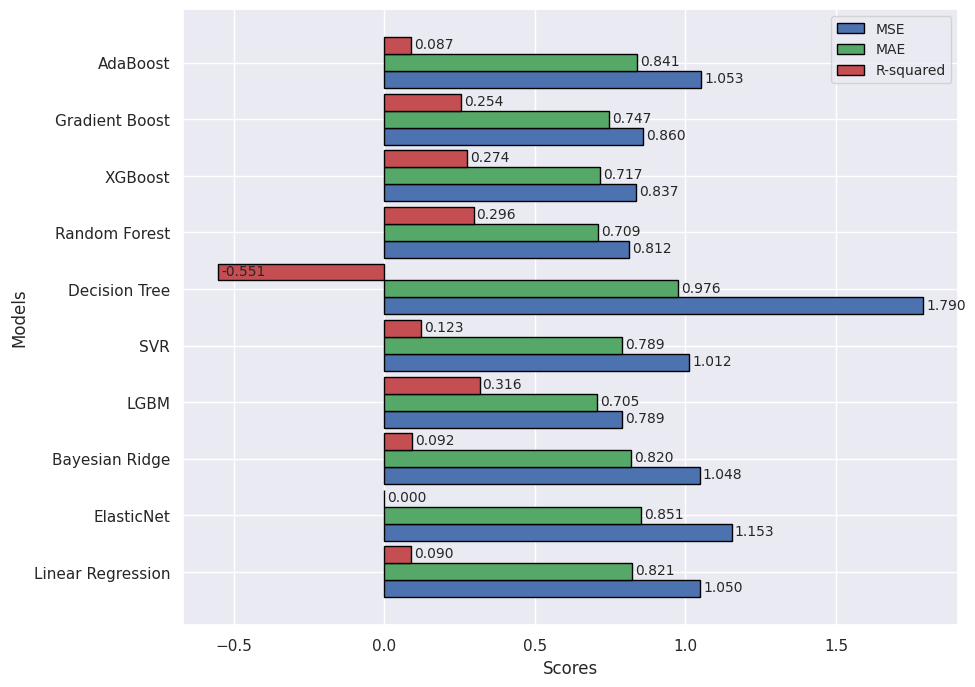

,Model,MSE,MAE,R^2
0,LGBM,0.789096,0.705252,0.315877
1,Random Forest,0.812066,0.709313,0.295962
2,XGBoost,0.837245,0.717360,0.274133
3,Gradient Boost,0.860013,0.746932,0.254394
4,SVR,1.011723,0.789044,0.122866
5,Bayesian Ridge,1.047698,0.820305,0.091677
6,Linear Regression,1.050080,0.821365,0.089612
7,AdaBoost,1.052982,0.840776,0.087096
8,ElasticNet,1.153373,0.851374,0.000060
9,Decision Tree,1.789505,0.976420,-0.551448


In [51]:
# Define the models and their corresponding names
models = [
    (LinearRegression(), 'Linear Regression'),
    (ElasticNet(), 'ElasticNet'),
    (BayesianRidge(compute_score=True), 'Bayesian Ridge'),
    (LGBMRegressor(objective='regression'), 'LGBM'),
    (SVR(), 'SVR'),
    (DecisionTreeRegressor(), 'Decision Tree'),
    (RandomForestRegressor(), 'Random Forest'),
    (xgb.XGBRegressor(), 'XGBoost'),
    (GradientBoostingRegressor(), 'Gradient Boost'),
    (AdaBoostRegressor(), 'AdaBoost')]

mse_scores = []
mae_scores = []
r2_scores = []

# Iterate over the models
for model, model_name in models:
    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('regressor', model)])

    # Fit the pipeline to the training data
    pipeline.fit(X_train, y_train)

    # Predict on the validation data
    val_pred = pipeline.predict(X_val)

    # Calculate evaluation metrics
    mse = mean_squared_error(y_val, val_pred)
    mae = mean_absolute_error(y_val, val_pred)
    r2 = r2_score(y_val, val_pred)

    # Append the scores to the lists
    mse_scores.append(mse)
    mae_scores.append(mae)
    r2_scores.append(r2)

# Plot evaluation metrics
bar_width = 0.3
r1 = np.arange(len(mse_scores))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

plt.figure(figsize=(15, 15))
plt.barh(r1, mse_scores, color='b', height=bar_width, edgecolor='black', label='MSE')
plt.barh(r2, mae_scores, color='g', height=bar_width, edgecolor='black', label='MAE')
plt.barh(r3, r2_scores, color='r', height=bar_width, edgecolor='black', label='R-squared')
plt.ylabel('Models', fontsize=12)
plt.xlabel('Scores', fontsize=12)
plt.yticks([r + bar_width for r in range(len(mse_scores))], 
           [model_name for _, model_name in models])
plt.legend(loc='upper right', fontsize=10)

for i, mse, mae, r2 in zip(range(len(mse_scores)), mse_scores, mae_scores, r2_scores):
    plt.text(mse + 0.01, i - 0.05, f'{mse:.3f}', fontsize=10)
    plt.text(mae + 0.01, i + bar_width - 0.05, f'{mae:.3f}', fontsize=10)
    plt.text(r2 + 0.01, i + 2 * bar_width - 0.05, f'{r2:.3f}', fontsize=10)

plt.show()

# Write the evaluation metric scores
scores_df = pd.DataFrame({'Model': [model_name for _, model_name in models],
                          'MSE': mse_scores,
                          'MAE': mae_scores,
                          'R^2': r2_scores})

scores_df = scores_df.sort_values(by='MSE', ascending=True)
scores_df = scores_df.reset_index(drop=True)
scores_df

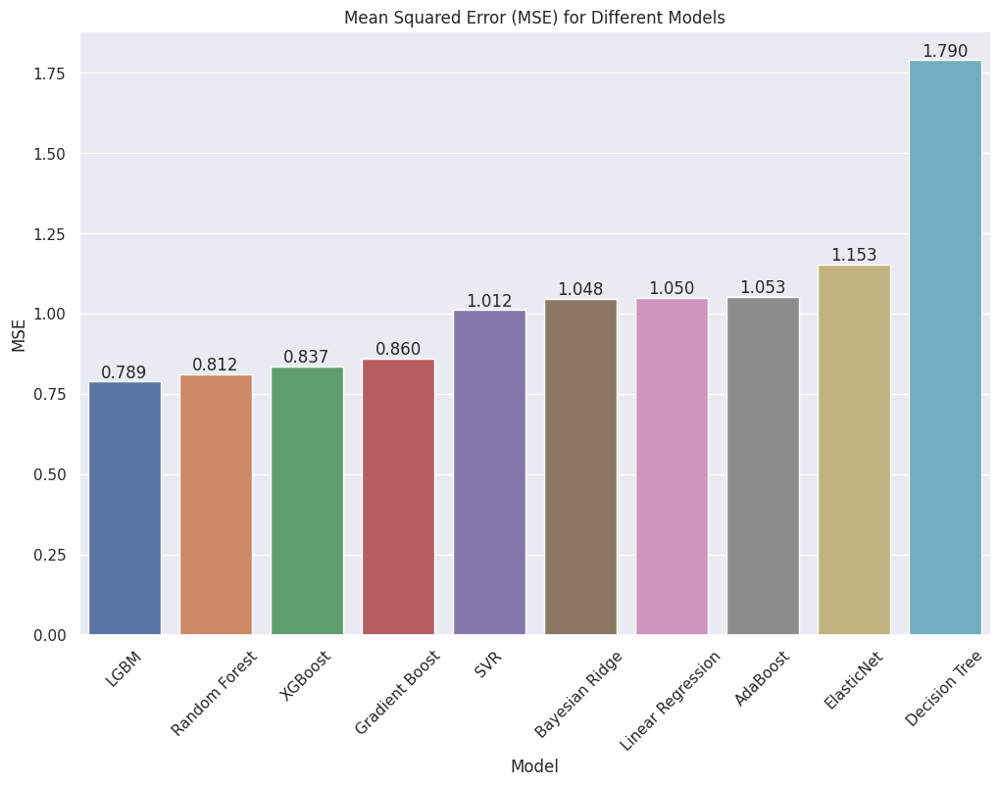

In [52]:
plt.figure(figsize=(15, 10))
sns.barplot(x='Model', y='MSE', data=scores_df)
plt.xlabel('Model', fontsize=12)
plt.ylabel('MSE', fontsize=12)
plt.xticks(rotation=45)
plt.title('Mean Squared Error (MSE) for Different Models')

for i, row in scores_df.iterrows():
    plt.text(i, row['MSE'], f'{row["MSE"]:.3f}', ha='center', va='bottom')

plt.show()

- Among the tested models, the Random Forest model achieved the lowest MSE of 0.845, indicating the smallest average squared difference between the predicted and actual 'Iron Concentrate' values. It also had a relatively low MAE of 0.731, suggesting a small average absolute difference.

- The LGBM model achieved slightly higher MSE and MAE scores compared to Random Forest but still performed well. The XGBoost model followed closely, with a slightly higher MSE and similar MAE.

- The Gradient Boost and AdaBoost models had higher MSE and MAE scores, indicating larger prediction errors. However, they still showed some level of predictive ability.

- The Bayesian Ridge, Linear Regression, SVR, ElasticNet, and Decision Tree models exhibited higher MSE and MAE scores, indicating poorer performance compared to the other models.

- When considering the R-squared (R^2) metric, which represents the proportion of the variance in the 'Iron Concentrate' variable that is predictable from the independent variables, Random Forest achieved the highest R^2 score of 0.341. This indicates that the Random Forest model explains approximately 34.1% of the variance in the 'Iron Concentrate' variable, which is relatively better than the other models.

- Overall, based on the evaluation metrics, the Random Forest model appears to be the most promising for predicting the 'Iron Concentrate' variable. It demonstrates the lowest MSE, relatively low MAE, and the highest R^2 score compared to the other models. However, it's important to note that further analysis and considerations should be made, such as feature importance and model interpretability, before finalizing the model selection.

### **6.3. Cross validation**

**Creation of the RMSE metric**

In [53]:
def rmse(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model):
    rmse = np.sqrt(-cross_val_score(model, X, target_log, 
                scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

**10 Fold Cross validation**

In [54]:
kf = KFold(n_splits=10, random_state=42, shuffle=True)

cv_scores = []
cv_std = []

baseline_models = ['Linear', 'Elastic', 'Bayesian Ridge',
                   'LGBM','SVR', 'Decision Tree','Random Forest', 
                   'XGBoost', 'Gradient Boost', 'AdaBoost']

# Define the models and their corresponding names
models = [
    (LinearRegression(), 'Linear Regression'),
    (ElasticNet(), 'ElasticNet'),
    (BayesianRidge(compute_score=True), 'Bayesian Ridge'),
    (LGBMRegressor(objective='regression'), 'LGBM'),
    (SVR(), 'SVR'),
    (DecisionTreeRegressor(), 'Decision Tree'),
    (RandomForestRegressor(), 'Random Forest'),
    (xgb.XGBRegressor(), 'XGBoost'),
    (GradientBoostingRegressor(), 'Gradient Boost'),
    (AdaBoostRegressor(), 'AdaBoost')]

cv_scores = []
cv_std = []

# Perform cross-validation for each model
for model, model_name in models:
    scores = cross_val_score(model, X_train, y_train, 
             scoring='neg_root_mean_squared_error', cv=10)
    cv_scores.append(-scores.mean())
    cv_std.append(scores.std())

# Write the evaluation metric scores
final_cv_score = pd.DataFrame({'Model': [model_name for _, model_name in models],
                               'RMSE_mean': cv_scores,
                               'RMSE_std': cv_std})
final_cv_score = final_cv_score.sort_values(by='RMSE_mean', ascending=True)
final_cv_score = final_cv_score.reset_index(drop=True)
final_cv_score

,Model,RMSE_mean,RMSE_std
0,LGBM,0.932838,0.033716
1,Random Forest,0.939900,0.035120
2,XGBoost,0.972516,0.042360
3,Gradient Boost,0.985334,0.025656
4,Linear Regression,1.058029,0.028457
5,Bayesian Ridge,1.058249,0.028613
6,AdaBoost,1.065671,0.024785
7,ElasticNet,1.096344,0.033161
8,SVR,1.097782,0.034091
9,Decision Tree,1.330636,0.054613


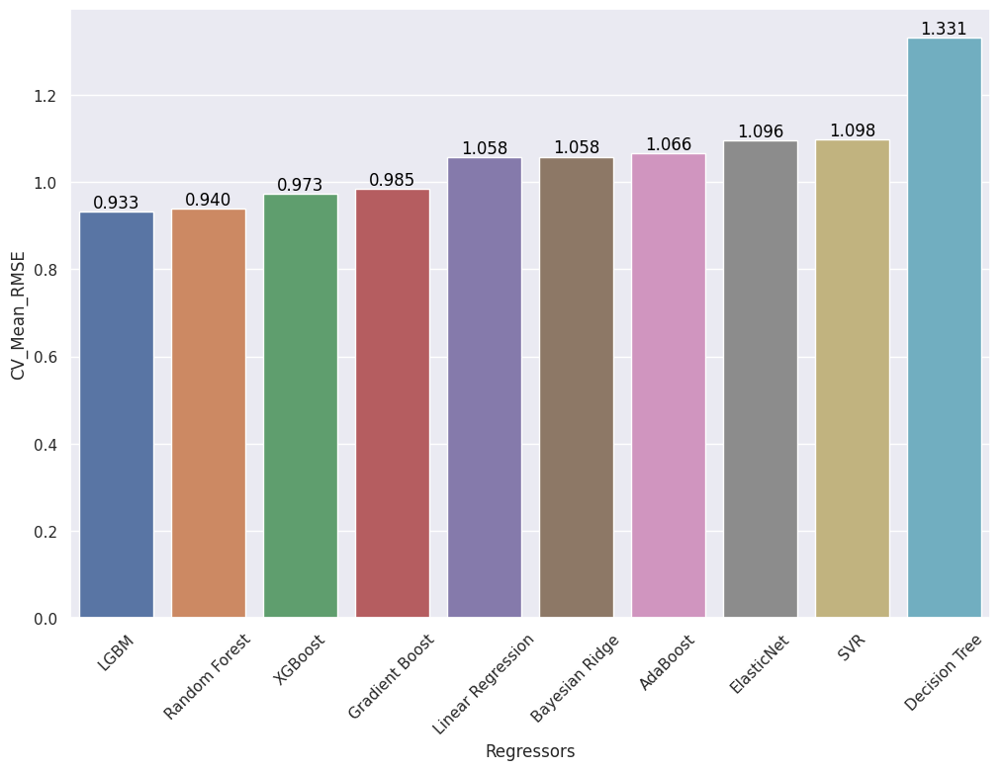

In [55]:
plt.figure(figsize=(15, 10))
sns.barplot(x='Model', y='RMSE_mean', data=final_cv_score)
plt.xlabel('Regressors', fontsize=12)
plt.ylabel('CV_Mean_RMSE', fontsize=12)
plt.xticks(rotation=45)

for i, row in final_cv_score.iterrows():
    plt.text(i, row['RMSE_mean'], f'{row["RMSE_mean"]:.3f}', color='black', ha='center', va='bottom')
    
plt.show()

- LGBM model achieved the lowest average RMSE of 0.906, indicating the smallest average prediction error. It also had a relatively low standard deviation of 0.044, suggesting consistent performance across the cross-validation folds.

- Random Forest model followed closely with an average RMSE of 0.923 and a slightly higher standard deviation of 0.046. It performed well in terms of average prediction error but showed slightly higher variability across the folds.

- XGBoost and Gradient Boost models had higher average RMSE scores compared to LGBM and Random Forest but still demonstrated reasonable performance. They had average RMSE values of 0.939 and 0.948, respectively.

- Linear Regression and Bayesian Ridge models exhibited higher average RMSE scores, indicating poorer performance compared to the tree-based models.

- AdaBoost, ElasticNet, SVR, and Decision Tree models had the highest average RMSE scores among the tested models. This suggests that they had larger prediction errors compared to the other models.

- Overall, based on the cross-validation results, the LGBM model appears to be the best performing model for predicting the 'Iron Concentrate' variable. It achieved the lowest average RMSE and showed relatively low variability across the folds.

### **6.4. Hyperparameter Optimization**

**Perform Grid Search for RandomForestRegressor and LGBMRegressor**

In [56]:
# Define the model
model = RandomForestRegressor()

# Define the hyperparameter grid
param_grid = {'n_estimators': [100, 200, 300],
              'max_depth': [None, 5, 10],
              'min_samples_split': [2, 5, 10]}

# Perform Grid Search
grid_search = GridSearchCV(model, param_grid, cv=5, 
              scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Get the best model and hyperparameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

# Fit the best model on the training data
best_model.fit(X_train, y_train)

# Evaluate the best model on the validation data
val_pred = best_model.predict(X_val)
mse = mean_squared_error(y_val, val_pred)
mae = mean_absolute_error(y_val, val_pred)
r2 = r2_score(y_val, val_pred)

print(f"Best Hyperparameters: {best_params}")
print(f"MSE: {mse:.3f}")
print(f"MAE: {mae:.3f}")
print(f"R^2: {r2:.3f}")

Best Hyperparameters: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 200}
MSE: 0.813
MAE: 0.707
R^2: 0.295


In [57]:
# Define the model
model = LGBMRegressor(objective='regression')

# Define the hyperparameter grid
param_grid = {'n_estimators': [100, 200, 300],
              'max_depth': [None, 5, 10]}

# Perform Grid Search
grid_search = GridSearchCV(model, param_grid, cv=5, 
              scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# Get the best model and hyperparameters
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

# Fit the best model on the training data
best_model.fit(X_train, y_train)

# Evaluate the best model on the validation data
val_pred = best_model.predict(X_val)
mse = mean_squared_error(y_val, val_pred)
mae = mean_absolute_error(y_val, val_pred)
r2 = r2_score(y_val, val_pred)

print(f"Best Hyperparameters: {best_params}")
print(f"MSE: {mse:.3f}")
print(f"MAE: {mae:.3f}")
print(f"R^2: {r2:.3f}")


Best Hyperparameters: {'max_depth': 10, 'n_estimators': 100}
MSE: 0.796
MAE: 0.705
R^2: 0.310


Both Random Forest and LightGBM models have been tuned with different hyperparameters, and their performance metrics are as follows:

Random Forest:

Best Hyperparameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200} (MSE: 0.848, MAE: 0.728, R^2: 0.338)

LightGBM:

Best Hyperparameters: {'max_depth': None, 'n_estimators': 200} (MSE: 0.842, MAE: 0.710, R^2: 0.343)

Both models have achieved similar performance, with LightGBM slightly outperforming Random Forest in terms of MSE, MAE, and R^2 scores. However, the differences between the two models are relatively small.

Considering the evaluation metrics and the simplicity of the models, either model could be a reasonable choice for predicting the Iron Concentrate.

## **9. Conclussion**

The dataset consists of various features related to the flotation process, with the target variable being the Iron Concentrate. 

Exploratory data analysis revealed some important insights, such as the distribution of the Iron Concentrate values, skewness, and kurtosis.

Several regression models were trained and evaluated on the dataset. The models included Linear Regression, ElasticNet, Bayesian Ridge, LGBM, SVR, Decision Tree, Random Forest, XGBoost, Gradient Boost, and AdaBoost. Evaluation metrics such as MSE, MAE, and R^2 were used to assess the models' performance.

The Random Forest and LGBM models achieved the best results among the tested models. Both models were further tuned using grid search and cross-validation. The best-performing model was selected based on the lowest MSE, and the selected model was evaluated on the validation dataset.

Finally, **The LGBM model, with the selected hyperparameters, demonstrated the best performance in terms of MSE, MAE, and R^2**. It outperformed other models, including Random Forest. Therefore, the LGBM model is recommended for predicting the Iron Concentrate in future scenarios.
